In [2]:
import cv2, os, math, glob
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from skimage import feature
from sklearn.linear_model import LinearRegression
from skimage.transform import rotate,warp


from utils.common_tools import annotate_image, show_bgr, assemble_frames_to_video
from utils.common_tools import stack_videos
#from detection_routine import find_birds
from utils.detection_tools import detect_sky, estimate_horizon_line_by_edges, create_line_roi_mask_vectorized
from utils.detection_tools import rectify_horizon, downsampler, translate_vertical, rotate_and_center_horizon
from utils.common_tools import annotate_image, show_bgr
from detection_routine import find_birds
from utils.common_tools import find_nonzero_bounding_box, trim_video, draw_parallel_lines

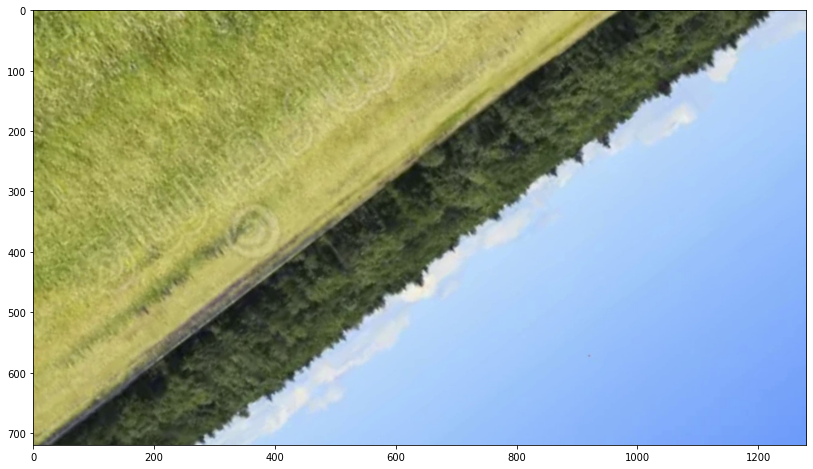

In [3]:
base_image_name = "horizon_2"
cap = cv2.VideoCapture(f"synth_videos/{base_image_name}/synth_track_video.mp4")

# Set the frame position (0-based index)
frame_index = 6
cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

# Read the frame
ret, raw_frame = cap.read()
show_bgr(raw_frame,w=14)

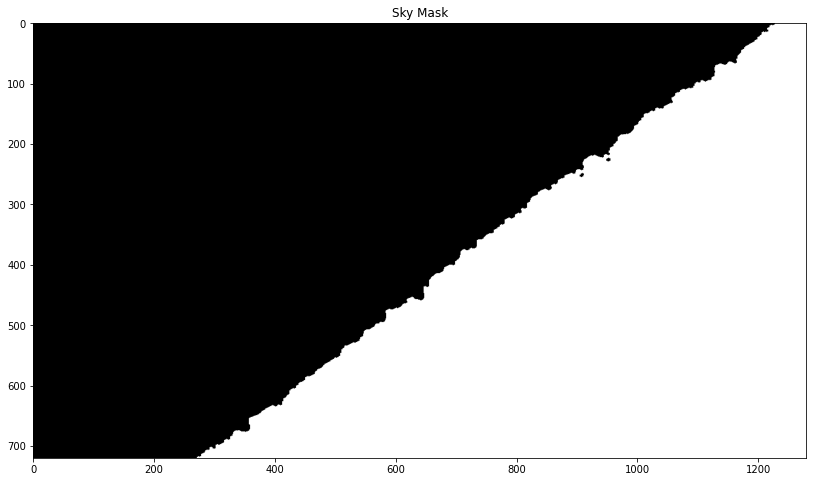

In [4]:
# Cell [3]: Sky Detection

sky_mask = detect_sky(raw_frame)  # user-defined function
show_bgr(sky_mask,w=14, title="Sky Mask")


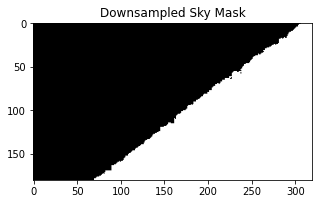

Horizon slope: -0.75773312477573, intercept: 231.83458148492986


In [5]:
# Cell [4]: Downsample & Estimate Horizon

scale_factor = 4
downsampled_sky_mask = downsampler(sky_mask, scale_factor=scale_factor)

# Estimate slope & intercept of the horizon
horizon_result = estimate_horizon_line_by_edges(downsampled_sky_mask)

if horizon_result is None:
    # Fallback if horizon detection fails
    slope, intercept = 0, downsampled_sky_mask.shape[0] / 2
else:
    slope, intercept = horizon_result

show_bgr(downsampled_sky_mask, title="Downsampled Sky Mask")
print(f"Horizon slope: {slope}, intercept: {intercept}")


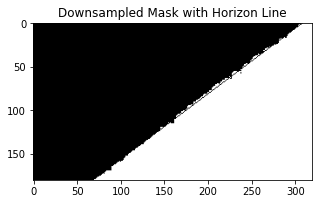

In [6]:
# Cell [5]: Draw Horizon on Downsampled

# For visualization
height_down, width_down = downsampled_sky_mask.shape[:2]
x_start, x_end = 0, width_down - 1

y_start = int(slope * x_start + intercept)
y_end   = int(slope * x_end   + intercept)

downsampled_sky_mask_horizon = downsampled_sky_mask.copy()
cv2.line(
    downsampled_sky_mask_horizon, 
    (x_start, y_start), 
    (x_end,   y_end),
    (0, 0, 255),
    1
)

show_bgr(downsampled_sky_mask_horizon, title="Downsampled Mask with Horizon Line")


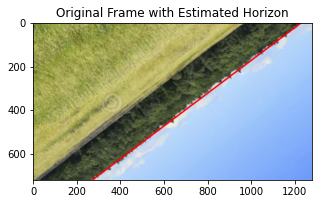

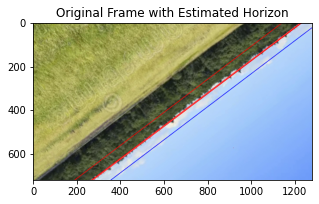

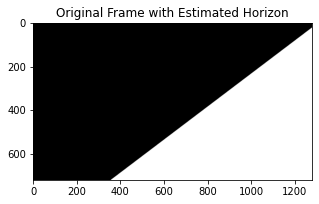

In [7]:
# Cell [6]: Draw Horizon on Original

annotated_image = raw_frame.copy()

cv2.line(
    annotated_image,
    (x_start * scale_factor, y_start * scale_factor),
    (x_end   * scale_factor, y_end   * scale_factor),
    (0, 0, 255),
    5
)

show_bgr(annotated_image, title="Original Frame with Estimated Horizon")

double_line, region_mask =  draw_parallel_lines(annotated_image,sky_mask, slope, intercept* scale_factor, distance=50)

show_bgr(double_line, title="Original Frame with Estimated Horizon")
show_bgr(region_mask, title="Original Frame with Estimated Horizon")





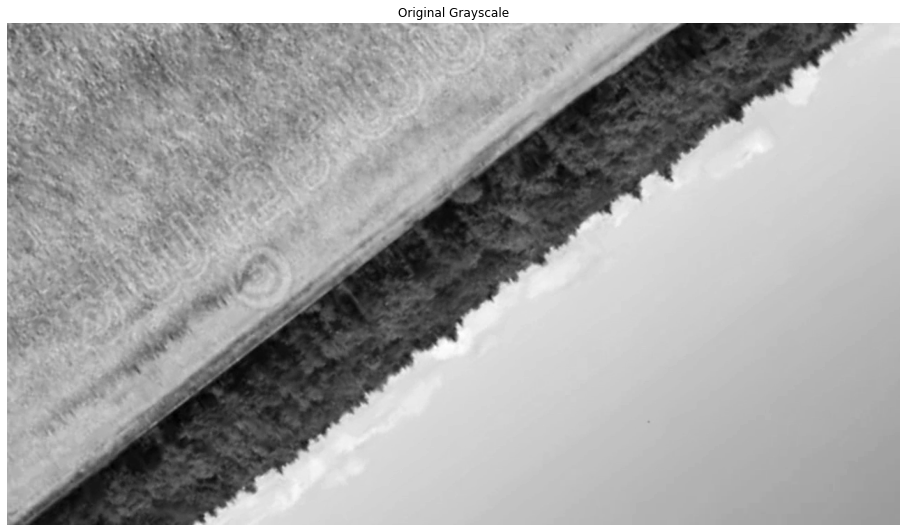

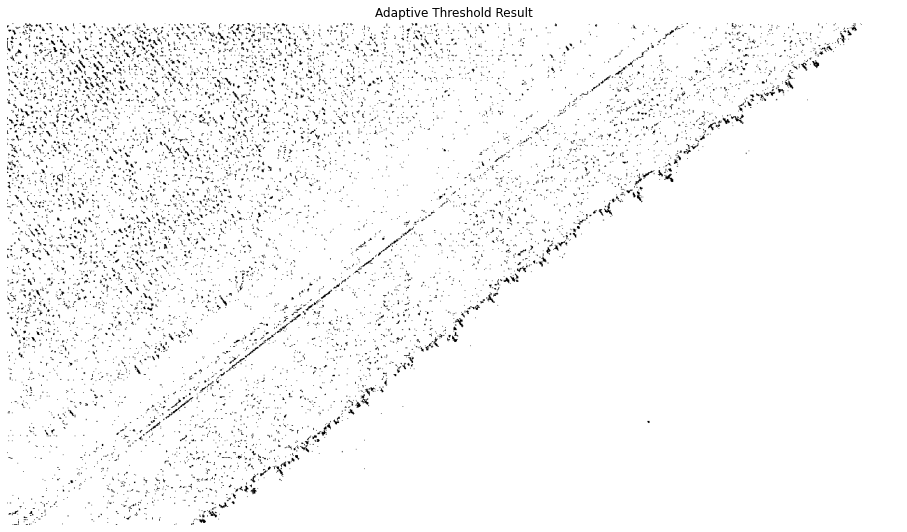

In [8]:
def show_gray(image, title=""):
    """Helper function to display a grayscale image with matplotlib."""
    plt.figure(figsize=(16, 14))
    plt.imshow(image, cmap="gray")
    plt.title(title)
    plt.axis('off')
    plt.show()

# Read an image (can be color or already grayscale)
input_image = raw_frame
# Convert to grayscale if needed
gray = cv2.cvtColor(input_image, cv2.COLOR_BGR2GRAY)

# Adaptive Threshold
# - maxValue = 255
# - adaptiveMethod = cv2.ADAPTIVE_THRESH_GAUSSIAN_C (or cv2.ADAPTIVE_THRESH_MEAN_C)
# - thresholdType = cv2.THRESH_BINARY
# - blockSize = 11 (size of neighborhood, must be odd)
# - C = 2 (constant subtracted from the mean or weighted mean)
adaptive_thresh = cv2.adaptiveThreshold(
    gray,
    maxValue=255,
    adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    thresholdType=cv2.THRESH_BINARY,
    blockSize=5,
    C=4
)

# Display
show_gray(gray, "Original Grayscale")
show_gray(adaptive_thresh, "Adaptive Threshold Result")

# remove_sky_band_distance(
#     sky_mask, 
#     slope, 
#     intercept, 
#     dist_threshold, 
#     reference_sky_pixel=None)

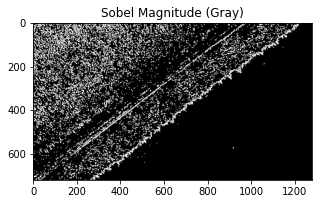

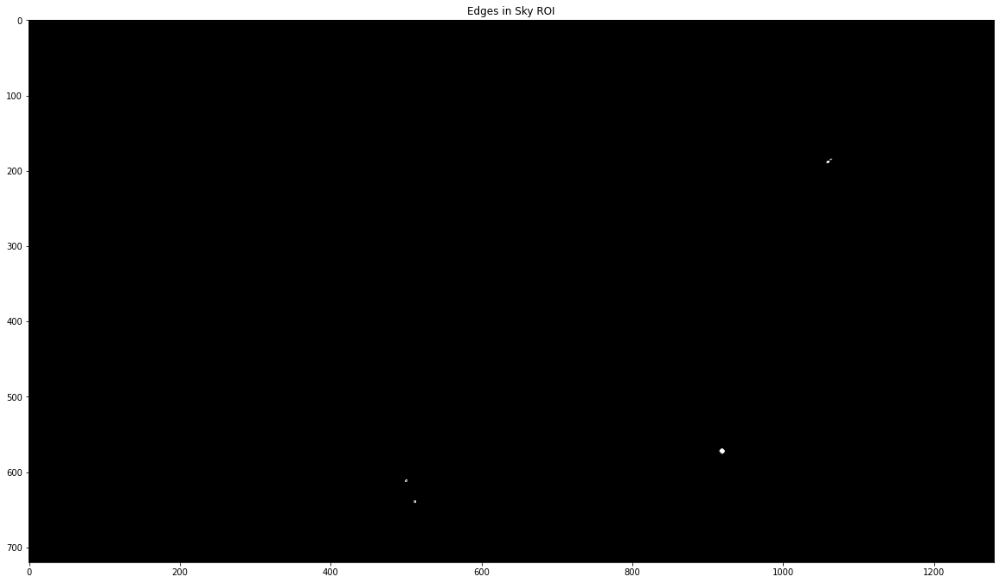

In [9]:
# Cell [9]: Sobel Edges in Sky ROI

gray_frame = cv2.cvtColor(raw_frame, cv2.COLOR_BGR2GRAY)

# Apply some Gaussian Blur
gaussian_blur_ksize = (3, 3)
gaussian_sigma = 0.5
blurred_gray = cv2.GaussianBlur(adaptive_thresh, gaussian_blur_ksize, gaussian_sigma)

# Sobel
sobel_x = cv2.Sobel(blurred_gray, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(blurred_gray, cv2.CV_64F, 0, 1, ksize=3)
sobel_mag = cv2.magnitude(sobel_x, sobel_y)
sobel_abs = cv2.convertScaleAbs(sobel_mag)

# Threshold
sobel_threshold = 50
_, sobel_mask = cv2.threshold(sobel_abs, sobel_threshold, 255, cv2.THRESH_BINARY)

# Restrict edges to sky ROI
edges_in_sky_roi = cv2.bitwise_and(sobel_mask, region_mask)

show_bgr(sobel_abs, title="Sobel Magnitude (Gray)")
show_bgr(edges_in_sky_roi, w=20,title="Edges in Sky ROI")



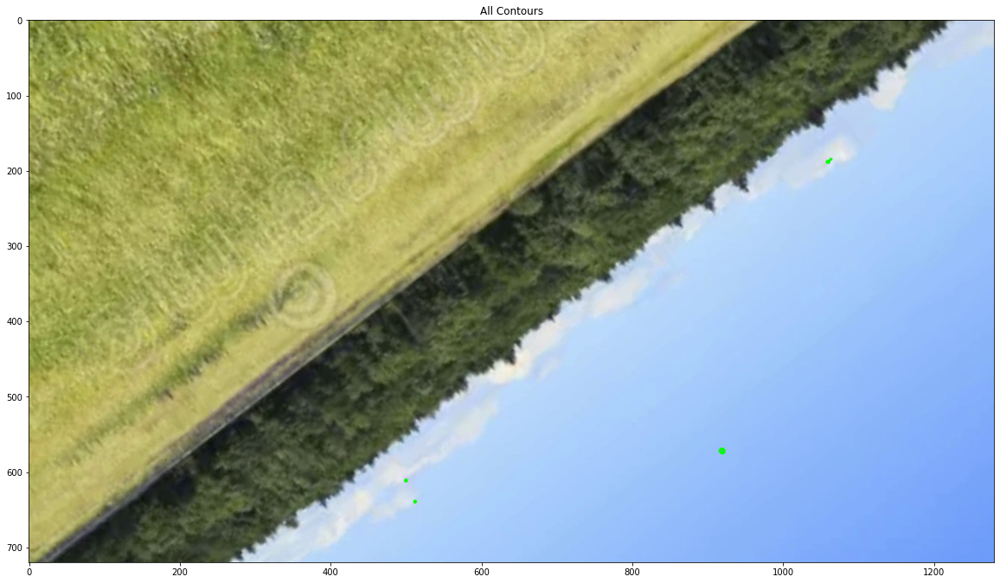

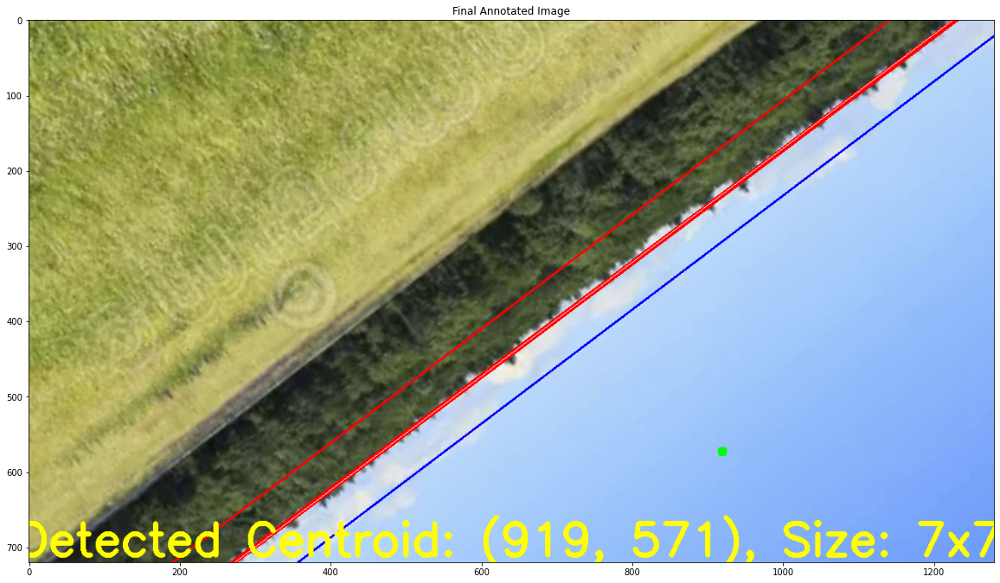

Centroid = (919, 571),  BoundingBox = 7 x 7


In [10]:
# Cell [10]: Find Largest Contour & Annotate

#contours, _ = cv2.findContours(edges_in_sky_roi[0:int(edges_in_sky_roi.shape[0]*.95),0:int(edges_in_sky_roi.shape[1]*.95)], cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours, _ = cv2.findContours(edges_in_sky_roi, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


#draw all contours on a copy of the original image
contour_image = raw_frame.copy()
cv2.drawContours(contour_image, contours, -1, (0, 255, 0), 2)
show_bgr(contour_image, title="All Contours",w=20)



annotated_final = annotated_image.copy()
cx, cy, bw, bh = 0, 0, 0, 0  # defaults

#### Add size and color bounds on contours

if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    M = cv2.moments(largest_contour)
    if M["m00"] != 0:
        cx = int(M["m10"] / M["m00"])
        cy = int(M["m01"] / M["m00"])
    else:
        cx = x + w // 2
        cy = y + h // 2
    
    bw, bh = w, h
    
    # Draw bounding box & annotation
    cv2.rectangle(annotated_final, (x, y), (x + w, y + h), (0, 255, 0), 4)
    text_str = f"Detected Centroid: ({cx}, {cy}), Size: {w}x{h}"
    annotate_image(annotated_final, text_str)
else:
    text_str = "Detected Centroid: (0, 0), Size: 0x0"
    annotate_image(annotated_final, text_str)

show_bgr(annotated_final,w=20, title="Final Annotated Image")

print(f"Centroid = ({cx}, {cy}),  BoundingBox = {bw} x {bh}")


In [11]:
def process_videos(base_name_list):
    for image_name in base_name_list:
        base_image_name = image_name

    # Paths for input and output
    truth_log_file_name = f"synth_videos/{base_image_name}/frame_data.txt"
    videos_to_process = [f"synth_videos/{base_image_name}/synth_track"]

    # Create the output directory for processed frames
    processed_frames_dir = f"synth_videos/{base_image_name}/processed_video_frames"
    rect_frames_dir = f"synth_videos/{base_image_name}/rectified_processed_video_frames"
    os.makedirs(processed_frames_dir, exist_ok=True)
    os.makedirs(rect_frames_dir, exist_ok=True)

    # Create or open the processed_data.txt file
    processed_data_file = open(f"synth_videos/{base_image_name}/processed_data.txt", "w")

    # Write the header for the processed_data.txt file
    processed_data_file.write("frame_index,cx,cy,w,h\n")

    for v in videos_to_process:
        video_to_process_path = v + "_video.mp4"
        cap = cv2.VideoCapture(video_to_process_path)

        if not cap.isOpened():
            raise ValueError(f"Error opening video file: {video_to_process_path}")

        for i in range(1, 60):
            if i % 10 == 0:
                print(f"processing frame {i} in {image_name}")
            frame_number = i
            # Set the frame position (0-based index)
            frame_index = frame_number - 1
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

            # Read the frame
            ret, raw_frame = cap.read()
            if not ret:
                print(f"Frame {frame_index} could not be read.")
                continue

            # Process the frame and get the output data
            rectified_frame, output_frame, cx, cy, w, h = find_birds(raw_frame)
            
            # Save the processed frame to the output directory
            output_frame_path = os.path.join(processed_frames_dir, f"frame_{frame_index:03}.jpg")
            rectified_frame_path = os.path.join(rect_frames_dir, f"frame_rect_{frame_index:03}.jpg")

            cv2.imwrite(output_frame_path, output_frame)
            cv2.imwrite(rectified_frame_path, rectified_frame)


            # Write the data for the current frame to processed_data.txt
            processed_data_file.write(f"{frame_index},{cx},{cy},{w},{h}\n")

    # Close the video capture and processed_data.txt file
    cap.release()
    processed_data_file.close()
    output_video_path = f"synth_videos/{base_image_name}/processed_track_video.mp4" 
    output_rect_video_path = f"synth_videos/{base_image_name}/rectified_processed_track_video.mp4" 

    assemble_frames_to_video(processed_frames_dir, output_video_path, fps=15, frame_pattern='frame_*.jpg')
    assemble_frames_to_video(rect_frames_dir, output_rect_video_path, fps=15, frame_pattern='frame_*.jpg')

    output_rectrim_video_path = f"synth_videos/{base_image_name}/processed_rect_trimmed_track_video.mp4"
    trim_video(output_rect_video_path , output_rectrim_video_path)

    stack_videos(video1_path = output_video_path,
                 video2_path = f"synth_videos/{base_image_name}/synth_track_box_video.mp4",
                 output_video_path = f"synth_videos/{base_image_name}/combined_video.mp4")
    
    stack_videos(video1_path = output_rect_video_path,
                 video2_path = f"synth_videos/{base_image_name}/synth_track_box_video.mp4",
                 output_video_path = f"synth_videos/{base_image_name}/rect_combined_video.mp4")
    

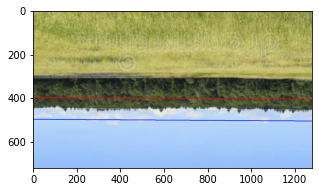

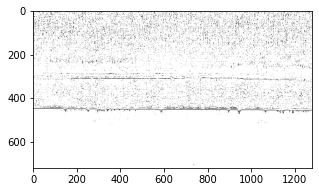

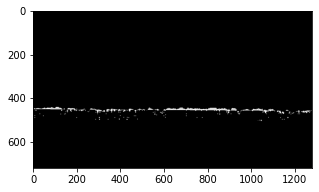

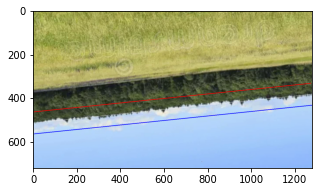

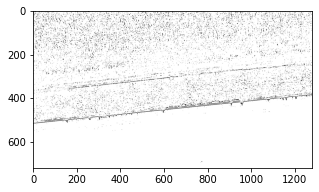

...

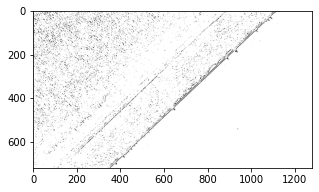

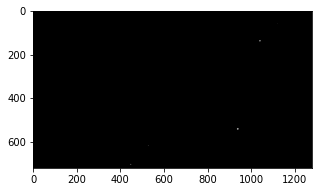

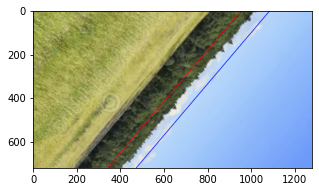

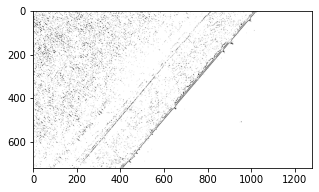

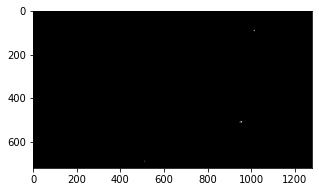

processing frame 10 in horizon_2


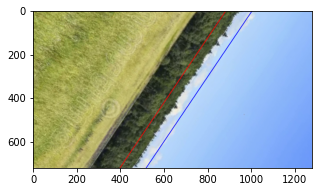

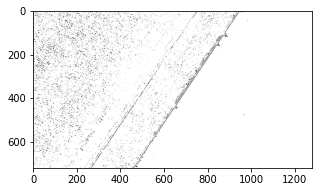

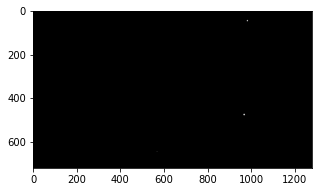

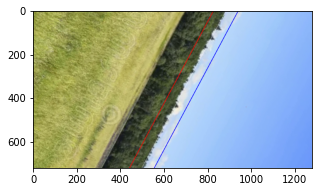

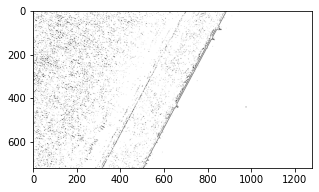

...

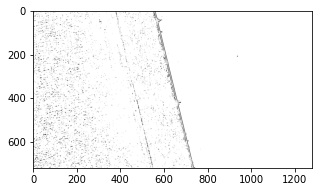

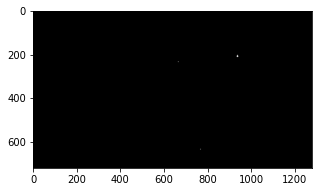

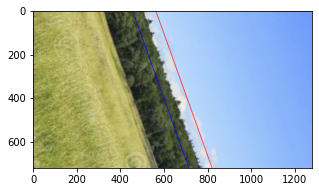

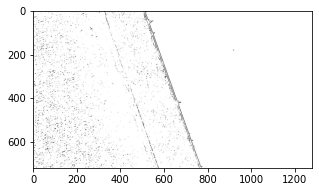

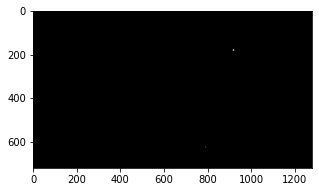

processing frame 20 in horizon_2


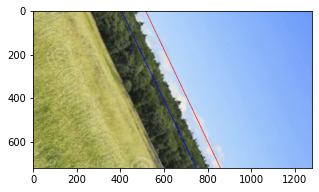

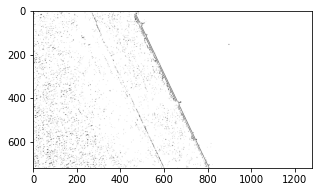

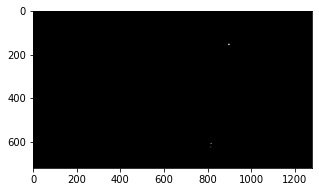

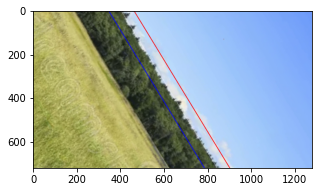

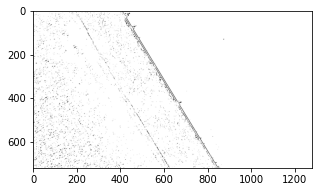

...

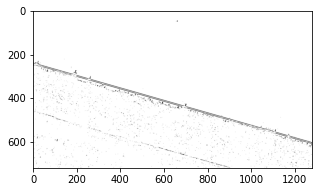

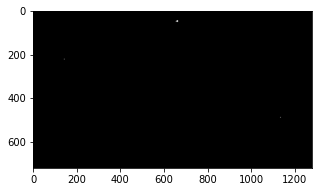

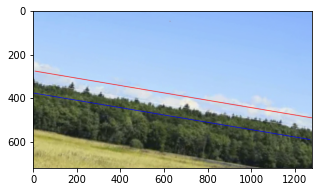

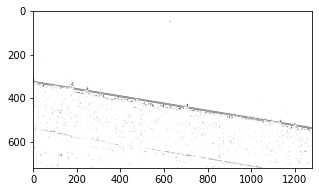

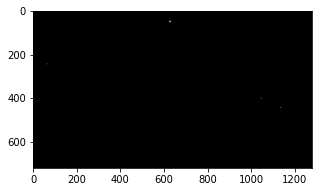

processing frame 30 in horizon_2


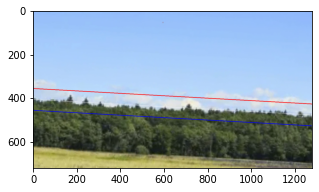

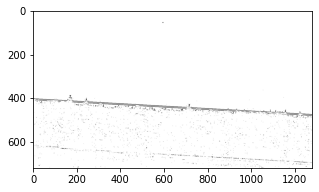

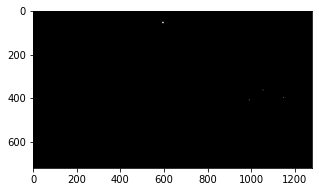

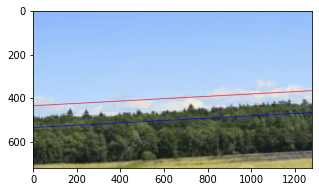

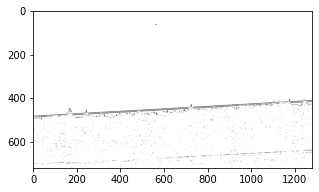

...

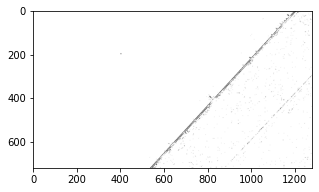

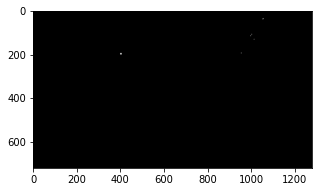

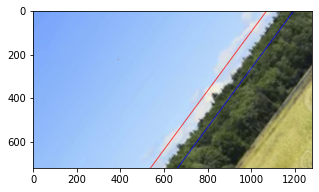

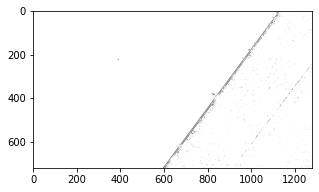

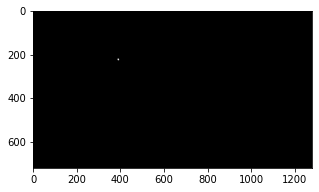

processing frame 40 in horizon_2


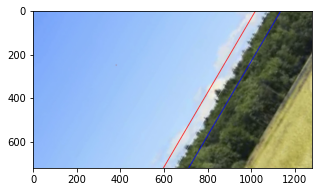

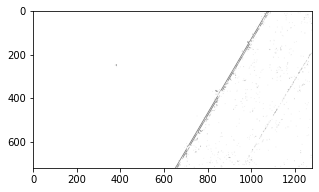

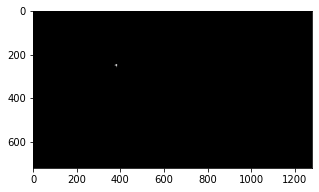

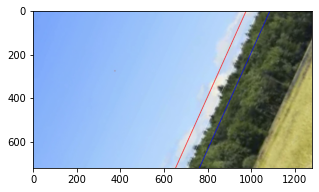

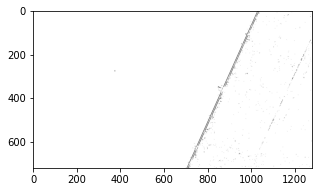

...

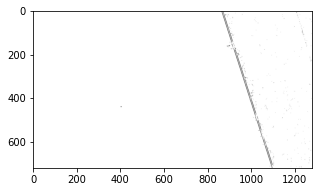

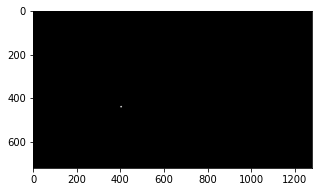

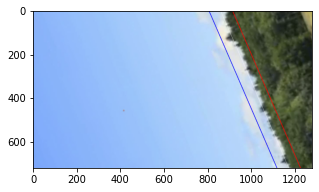

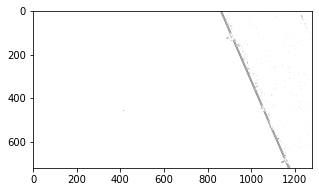

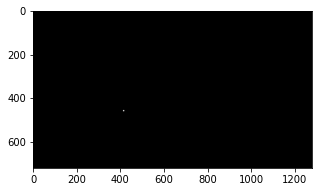

processing frame 50 in horizon_2


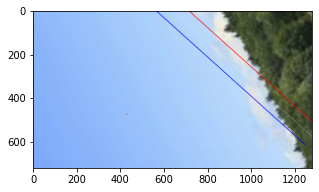

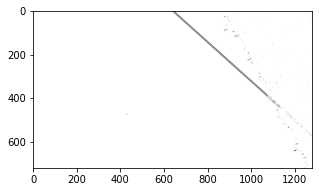

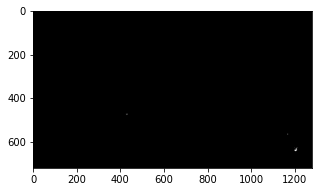

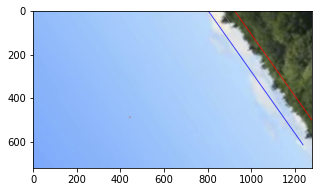

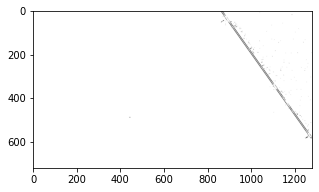

...

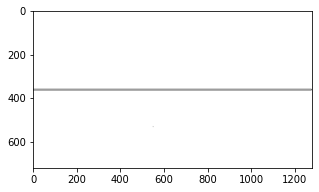

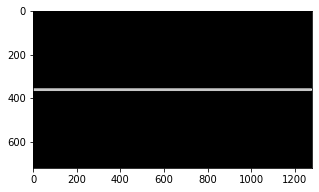

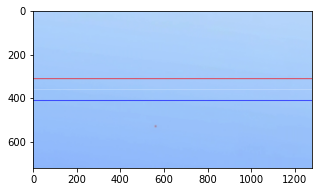

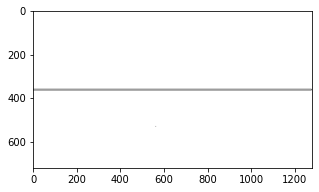

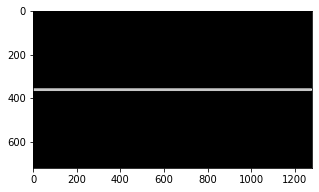

Starting video assembly from 59 frames...
Processed 10/59 frames.
Processed 20/59 frames.
Processed 30/59 frames.
Processed 40/59 frames.
Processed 50/59 frames.
Processed 59/59 frames.
Video successfully saved to 'synth_videos/horizon_2/processed_track_video.mp4'.
Starting video assembly from 59 frames...
Processed 10/59 frames.
Processed 20/59 frames.
Processed 30/59 frames.
Processed 40/59 frames.
Processed 50/59 frames.
Processed 59/59 frames.
Video successfully saved to 'synth_videos/horizon_2/rectified_processed_track_video.mp4'.
Combined video saved at synth_videos/horizon_2/combined_video.mp4
Combined video saved at synth_videos/horizon_2/rect_combined_video.mp4


In [12]:
#image_list = #4","horizon_6"]
process_videos(["horizon_2",])
